# ***SUBMITED BY : CS22MTECH02002 SHIKHAR JAIN ***


# **AT THE END OF THE SCRIOT YOU WILL FIND A LARGE DICTIONARY TAKING USER INPUTS FOR DIFEFRNR PARAMETERS REALTED TO CNN ARCHITECTURE . FROM THERE UPTILL END USER CAN CHANGE OPTIONS AND GENERATE DIFFERENT CNN ARCHITECTURES , DATA SAMPLES etc. ALL THE NEEDED INFO TO ASSIST WITH THE SMOOTH TESTINGS AND EXECUTION RELIES THERE ONLY PLS USE THAT...**


# ***NOTE: KINDLY RERUN ALL THE CELLS (RUN ALL in VSCode & Colab) AFTER DOING ANY CHANGE IN PARAMETER DICTIONARY CAUSE IT WILL ALLOW MODEL TO ADJUST FOR THE NEW CHANGE SUCCESFULLY ELSE ERRORS CAN COME.***

# *** **NOTE: FEED-FORWARD FUNCTION WHICH ACTUALLY DRIVES COMPLETE MODEL ARCHITECTURE HAS ONE ARGUMENT "save_weights" ; IF USER WANTS THAT ON SEVERAL "REALATED" INVOCATIONS THE PARAMETERS OF MODEL DOESNT CHANGE AFTER ONE-TIME INTIALIZATION THEN USER SHOULD PASS "True" ELSE "False" WOULD MEAN THAT ON EVERY NEW INVOCATION WEIGHTS OF TEH MODEL WILL BE RE-SAMPLED.**


In [147]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
from torchvision.datasets import CIFAR10 as cifar
from torchvision import transforms
from PIL import Image
import random
from sklearn.metrics.pairwise import cosine_similarity
import warnings
warnings.filterwarnings("ignore")

In [148]:
data=cifar("/home/shikharj/CIFAR10",train=True,transform=transforms.ToTensor(),download=True) # here yu will get 50000 examples where each is in tensor form of shape(3,32,32)


Files already downloaded and verified


In [149]:
epsilon=1.0*10**-7

Activation functions. Each of them will be implemented in a way auch that regardless of their usage to either generate activation map from pre-activated input map or activated output from hidden layer neuron pre-activation . It is possible because they work elemnt wise. 
So if input is H*W map with C channels then a activation fucntion will be applied C*H*W times.  

1) Relu Activation

2) Tanh Activation

3) Sigmoid Activation

4) Parametric-Relu Activation

5) Softmax Activation

6) Linear Activation



In [150]:
# activations fucntions for output of convolution 
# They take input a 2-D input of H*W , apply non-linearity to each element and output an activated map of dim H*W

def sigmoid(input_map_2d):
  """ sigmoid activation function"""
  row,col=input_map_2d.shape  
  activated_map=np.zeros((row,col))
  for i in range(row):
    for j in range(col):
      activated_map[i][j]=1/(1+np.exp(-1.0*input_map_2d[i][j])+epsilon)
  return activated_map    

def relu(input_map_2d):
  """ relu activation function"""
  row,col=input_map_2d.shape  
  activated_map=np.zeros((row,col))
  for i in range(row):
    for j in range(col):      
      activated_map[i][j]=max(0.0,input_map_2d[i][j])
  return activated_map    

def param_relu(input_map_2d,alpha=0.25): # this alpha is same as present in torch.nn.PReLU
  """ parametric relu activation function"""
  row,col=input_map_2d.shape
  activated_map=np.zeros((row,col))
  for i in range(row):
    for j in range(col):
      activated_map[i][j]=max(0.0,input_map_2d[i][j])+alpha*min(0.0,input_map_2d[i][j])
  return activated_map    

def tanh(input_map_2d):
  """ tanh activation function"""
  row,col=input_map_2d.shape
  activated_map=np.zeros((row,col))
  for i in range(row):
    for j in range(col):
      a=np.exp(input_map_2d[i][j]+epsilon)
      b=np.exp(-1.0*input_map_2d[i][j]+epsilon)
      activated_map[i][j]=(a-b)/(a+b)
  return activated_map    

def softmax(input_map_2d):
  """ softmax activation function"""
  row,col=input_map_2d.shape
  activated_map=np.zeros((row,col))
  expo_sum=0.0
  for i in range(row):
    for j in range(col):      
      #activated_map[i][j]=
      expo_sum+=np.exp(input_map_2d[i][j]+epsilon)
  for i in range(row):
    for j in range(col):      
      activated_map[i][j]=np.exp(input_map_2d[i][j]+epsilon)/expo_sum
        
  return activated_map

def linear(input_map_2d):
  """ linear activation """
  return input_map_2d

Below are the distrbution function used to initialize weights and biases. They are implemented in a way such that same fucntion can be used in both CNN and FNN layers.

In [151]:
def uniform(size,start=-1.0,end=1.0):
  return np.random.uniform(start,end,size)

def normal(size,mean=0.0,std_dev=1.0):
    return np.random.normal(mean,std_dev,size)

def xavier_uniform(size,mean=0.0,std_dev=1.0):
  k=0.5*np.sqrt(6/(size[0]+size[1]))
  return np.random.uniform(-1.0*k,k,size)

def xavier_normal(size):
  k=0.5*np.sqrt(6/(size[0]+size[1]))
  return np.random.normal(0,k,size)

def kaiming_uniform(size):
  k=0.5*np.sqrt(3/size[0])
  return np.random.uniform(-1.0*k,k,size)

def kaiming_normal(size):
  k=0.5*np.sqrt(3/size[0])
  return np.random.normal(0,k,size)

def torch_uniform(size):
  k=1/(size[0]*size[1])
  return np.random.uniform(-1.0*np.sqrt(k),np.sqrt(k),size)



In [152]:
conv_filter_weight_buffer={}
conv_filter_bias_buffer={}
flatten_weight_matrix_buffer=[]
mlp_weight_tuple_buffer=[]
mlp_bias_tuple_buffer=[]


Below function will intialize a stack of F conv filters each of H*W 2D-dimension and D depth. It also accepts the distribution function which will be used to sample out the values 

In [153]:
# will initialize whole stack of conv_filters which will be used in a unit
def conv_filter_param_intialization(conv_filter_stack,unit_count,distribution_function=normal,bias=True,save_weights=False):
  
  F,D,H,W=conv_filter_stack.shape
  total_weights=F*D*H*W
  total_biases=F
  rand_weight=None  
  rand_bias=None

  global conv_filter_weight_buffer
  global conv_filter_bias_buffer 
  if str(unit_count) not in conv_filter_weight_buffer.keys():
    conv_filter_weight_buffer[str(unit_count)]=None
  if str(unit_count) not in conv_filter_bias_buffer.keys():
    conv_filter_bias_buffer[str(unit_count)]=None
  
  if save_weights == True:
    if conv_filter_weight_buffer[str(unit_count)] is None:
      print("For CNN Unit :{} Initializing weights using {} distribution/technique".format(unit_count,distribution_function.__name__))
      conv_filter_weight_buffer[str(unit_count)]=np.copy(distribution_function(total_weights).reshape((F,D,H,W)))      
      if bias==True:        
        conv_filter_bias_buffer[str(unit_count)]=np.copy(distribution_function(total_biases).reshape((F)))
      else:
        conv_filter_bias_buffer[str(unit_count)]=np.copy(np.zeros(shape=F))

    else:
      # just read the weights from buffer only
      print(" For CNN Unit :{} Using saved weights from buffer itself".format(unit_count))
    rand_weight=np.copy(conv_filter_weight_buffer[str(unit_count)])
    rand_bias=np.copy(conv_filter_bias_buffer[str(unit_count)])
  
  elif save_weights == False:
    #nullify/invalidate the buffer
    #re-sample weights
    print("For CNN Unit :{} Initializing weights using {} distribution/technique".format(unit_count,distribution_function.__name__))
    conv_filter_weight_buffer[str(unit_count)]=None
    conv_filter_bias_buffer[str(unit_count)]=None
    rand_weight=distribution_function(total_weights).reshape((F,D,H,W))
    if bias==True:
      rand_bias=distribution_function(total_biases).reshape((F))
    else:
      rand_bias=np.zeros(shape=F)



  
  #
  #if distribution_function== uniform:    
  #print("*********")
  #print(rand_weight)

  return (rand_weight,rand_bias)
      


Q1) # ***Convolution function:*** 

It accepts an image input, a filter kernel, stride, padding and the non-linear function. The function must convolve the input image (after padding if specified) with the
kernel (at the specified stride size) and generate an output activation after applying the specified
non-linearity. Verify with the standard options for the non-linear activation functions - sigmoid,
tanh, ReLU, Parametric ReLU (PReLU). Display the input image (e.g. small image of the IITH
logo), the filter kernel and the output activation map. Ensure that your function can accept
multi-channel input and a corresponding kernel volume.

AIM : To take an image/activation map as input , convolve it with just one filter/kernel . Now depth of this kernel will depend on depth/channels of the input. 

NOTE: This function can take non-uniform/non-square padding and striding.

Untitled presentation.svg

Z1,Z2,Z3,Z4 are the regions formed after drwaing boundries corresponding to padding .

In [154]:
# Note: it is assumed that conv_kernel_stack contains weights of the kernels & conv_kernel_bias contains biases
def convolution_function(image,conv_kernel_weights,conv_kernel_bias,unit_count,conv_kernel_count,stride=(1,1),padding=(0,0),dilation=(1,1),non_linear_activation=relu,display_bool=False,non_linearity_verification=True,padding_method="zero"):
  # NOTE: the input to this function will always be 3-D 
  I_d,I_h,I_w=image.shape # getting image depth/channels, height,width
  # NOTE: the output of this function will always be 3-D
  F_d,F_h,F_w=conv_kernel_weights.shape # getting no. of kernels,depth of each kernel{which is same as image depth/channels}, height, width

  # pad input:
  if padding[0]<0 or padding[1]<0:
    print(" padding can't be negative ")
  H_padded=I_h+2*padding[0]
  W_padded=I_w+2*padding[1]
  padded_inp=np.zeros(shape=(I_d,H_padded,W_padded))  

  # padding the Z1
  for d in range(image.shape[0]):
    for i in range(0,padding[0]):
      for j in range (0,W_padded):
        if padding_method=="zero":
          padded_inp[d][i][j]=0.0
    # padding the Z2    
    for i in range(I_h+padding[0],H_padded):
      for j in range (0,W_padded):
        if padding_method=="zero":
          padded_inp[d][i][j]=0.0
    # padding the Z3    
    for i in range(padding[0],I_h+padding[0]):
      for j in range (0,padding[1]):
        if padding_method=="zero":
          padded_inp[d][i][j]=0.0
    # padding the Z4    
    for i in range(padding[0]+1,I_h+padding[0]):
      for j in range (I_w+padding[1],W_padded):
        if padding_method=="zero":
          padded_inp[d][i][j]=0.0

  # populating left part of paded input with actual image
  #I_rc=0
  for d in range(image.shape[0]):
    I_rc=0
    for i in range(padding[0],I_h+padding[0]):
      I_cc=0
      for j in range(padding[1],I_w+padding[1]):
        padded_inp[d][i][j]=image[d][I_rc][I_cc]
        I_cc+=1
      I_rc+=1      
  

  # alloacting sapce for output
  # using formuales from pytorch documentation
  # since dilation is not asked hence its by-default value of 1 is used 

  output_H=np.floor((I_h+2*padding[0]-dilation[0]*(F_h-1)-1)/stride[0]+1)
  output_W=np.floor((I_w+2*padding[1]-dilation[1]*(F_w-1)-1)/stride[1]+1)

  output_H=int(output_H.item())
  output_W=int(output_W.item())  
  

  output_pre_activation_map=np.zeros(shape=(output_H,output_W))

  # Now taking this padded input we have to convolve thsi with each conv_filter
  #selecting a particular kernel/filter  
  
  # moving over the image by step-size=stride for that axis
  out_rc=0
  for i in range(0,H_padded-F_h,stride[0]):
    out_cc=0
    for j in range(0,W_padded-F_w,stride[1]):
      #print("j is --- ",j)
      #for every channel in the image
      conv_sum_3d=0.0
      for channel in range(padded_inp.shape[0]):            
        image_2d=padded_inp[channel]
        conv_kernel_weights_2d=conv_kernel_weights[channel]
        conv_sum_2d=0.0
        #slecting the correct sub-rectangle inside this channel's 2-d input map that is same in dimension with filter kernel        
        f_rc=0
        for x in range(i,i+F_h):
          f_cc=0
          for y in range(j,j+F_w):
            conv_sum_2d+=image_2d[x][y]*conv_kernel_weights_2d[f_rc][f_cc]
            f_cc+=1
          f_rc+=1  
        
        conv_sum_2d+=conv_kernel_bias        
        conv_sum_3d+=conv_sum_2d      
     
      output_pre_activation_map[out_rc][out_cc]=conv_sum_3d
      out_cc+=1
    out_rc+=1

  # aplying specified non linearity
  #print("Using non linearity: {} for activation",non_linear_activation.__name__)
  output_activated_map =non_linear_activation(output_pre_activation_map)
  
  pytorch_standard_activ=None

  if non_linearity_verification == True:
    print("------- Verifying the non-linear activations ------- ")        
    if  non_linear_activation.__name__ == "relu":
      pytorch_standard_activ=torch.nn.functional.relu
    elif non_linear_activation.__name__ == "sigmoid":
      pytorch_standard_activ=torch.nn.functional.sigmoid
    elif non_linear_activation.__name__ == "tanh":
      pytorch_standard_activ=torch.nn.functional.tanh
    elif non_linear_activation.__name__ == "param_relu":
      pytorch_standard_activ=torch.nn.functional.prelu
    
    #print(" activation map from self implemented {} is {}".format(non_linear_activation.__name__,non_linear_activation(output_pre_activation_map)[0,:]))
    stan=pytorch_standard_activ(torch.from_numpy(output_pre_activation_map))
    #print("activation map from pytorch standard {} is  {}".format(pytorch_standard_activ.__name__,stan[0,:]))
    stan_np=stan.numpy()
    print(" Difference between two implementations is ","**** NO DIFFERENCE ****" if np.all(np.absolute(stan_np-output_activated_map)<=.001)== True else " ##### THERE ARE SOME DIFFRENCES ####")


  if display_bool==True:
    fig,ax=plt.subplots(1,3,figsize=(15,5))    
    mean_image=np.mean(image,axis=0)
    ax[0].imshow(torch.from_numpy(mean_image))
    ax[0].set_title(" *** Visualizing Input *** ")    
    mean_conv_kernel_weights=np.mean(conv_kernel_weights,axis=0)
    ax[1].imshow(torch.from_numpy(mean_conv_kernel_weights))
    ax[1].set_title("*** Visualizing filter ***")    
    ax[2].imshow(output_activated_map) # since output_activated_map is a 2-D array
    ax[2].set_title("*** Visualizing activated map ***")
    fig.suptitle(" FOR UNIT : {} & CONVOLUTION FILTER NO. {} ".format(unit_count,conv_kernel_count))


  return output_activated_map  




           


 # **Q3) Convolution layer function:**

It accepts as input a volume (image or activation maps), number of
filters, kernel dimensions, stride, padding and the non-linear function. The function must convolve
the input volume (after padding if specified) with each of the kernels (at the specified stride size)
and generates an output activation volume after applying the specified non-linearity. Display the
input image or activation maps, the filter kernels and the output activation maps. Verify that the
output of this function does indeed have the expected size (W × H × C) as discussed in class.

AIM : analogous to torch.nn.Conv2d it takes an input images/a volume activation maps , alongwith ouput channels or no. of convolution filters and according to padding, striding convolve each channel of an image with each of the filter maps & produce activated output

Thus if input is (Cin,H,W) where Cin=channels ; H,W image Dimensions ,
than output will be (Cout,Hout,Wout) where Cout = No. of kernels/filters and Hout,Wout is in accordance with padding,striding etc.

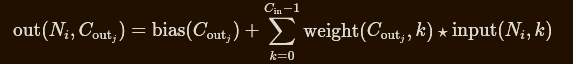

Basically for a unit it will generate the final activation map{ which is the input to the pooling layer} that is the Cout activation maps.

In [155]:
def convolution_layer_function(image,output_channels,kernel_dimension,stride,padding,unit_count,non_linearity_verification=False,output_activation_dim_verification=False,bias=True,non_linear_activation=relu,display_bool=False,padding_method="zero",save_weights=False):
  I_d,I_h,I_w=image.shape
  F_h=kernel_dimension[0]
  F_w=kernel_dimension[1]
  #generating a convolution filter stack and intializing them
  conv_filter_stack=np.zeros(shape=(output_channels,I_d,F_h,F_w))
  conv_filter_weights,conv_filter_bias=conv_filter_param_intialization(conv_filter_stack,unit_count,normal,bias,save_weights=save_weights)

    
  #allocating arrays to store activation maps
  # below list will accumulate all the 2-D activation maps output from call to convolution function
  # then by using first resahping them all to h*w*1 , using np.concatenate and np.moveaxis , ultimately we can get the final 3-D result.
  conv_output=[]

  # pick a kernel and convolve with the image
  for C_out in range(output_channels):
    f_w=conv_filter_weights[C_out]
    f_b=conv_filter_bias[C_out]
    
    temp=convolution_function(image,f_w,f_b,unit_count=unit_count,conv_kernel_count=C_out+1,stride=stride,padding=padding,non_linear_activation=non_linear_activation,non_linearity_verification=non_linearity_verification,display_bool=display_bool)
    
    conv_output.append(temp.reshape(temp.shape[0],temp.shape[1],1))

  
  conv_output=tuple(conv_output)
  
  conv_output=np.concatenate(conv_output,axis=2)
  conv_output=np.moveaxis(conv_output,-1,0)

  if output_activation_dim_verification == True:

    print(" **** VERIFYING THE OUTPUT DIMENSION AGAINST WHAT HAS BEEN TAUGHT IN LECTURES ****")
    print(" output dimension are ---> channels: {} , height: {}, width:{} ".format(conv_output.shape[0],conv_output.shape[1],conv_output.shape[2]))  
    print("formulae taught in class for output h and w are \n outH = ((Hin-Hkernel+2*Hpad)/Hstride)+1 \n and \n outW = ((Win-Wkernel+2*Wpad)/Wstride)+1")
    lect_outH=np.floor(((I_h-F_h+2*padding[0])/stride[0])+1)
    print("That is outH=(({}-{}+2*{})/{})+1 = {} ".format(I_h,F_h,padding[0],stride[0],lect_outH))
    lect_outW=np.floor(((I_w-F_w+2*padding[1])/stride[1])+1)
    print("That is outW=(({}-{}+2*{})/{})+1 = {} ".format(I_w,F_w,padding[1],stride[1],lect_outW))

  return conv_output  



In [156]:
# helper pooling functions
# they are sort of "local" functions as their input is a flattened out sub-grid of actual input
def max_pool(flatten):
  return max(flatten)

def average_pool(flatten):
  s=sum(flatten)  
  return s/len(flatten)

def min_pool(flatten):
  return min(flatten)  
  

# **Q2) Pooling function:**

It accepts as input the activation map output from the convolution function,a pooling function, and stride. The function must output the appropriately pooled activation map.Display the input activation map and the pooled output. 

As described in below image the formulae for Hout and Wout due to pooling kernel operation is same as that of conv kernel .

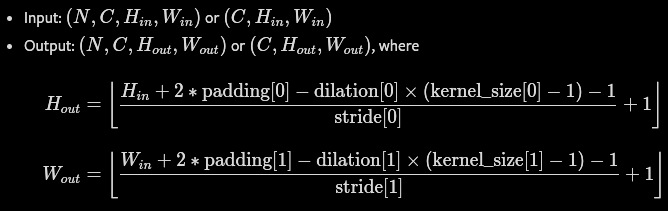

In [157]:
def pooling_function(conv_out,pooling_kernel_dim,unit_count,pool_kernel_count,pool_kernel_function=max_pool,stride=(1,1),padding=(0,0),dilation=(1,1),display_bool=False):
  C_h,C_w=conv_out.shape[0],conv_out.shape[1]
  P_h,P_w=pooling_kernel_dim[0],pooling_kernel_dim[1]
  #allocate output array
  H_pool=np.floor(((C_h+2*padding[0]-dilation[0]*(P_h-1)-1)/stride[0])+1)
  W_pool=np.floor(((C_w+2*padding[1]-dilation[1]*(P_w-1)-1)/stride[1])+1)
  H_pool=int(H_pool.item())
  W_pool=int(W_pool.item())

  pool_out=np.zeros(shape=(H_pool,W_pool))

 
  #select a 2D region on filter to pool with
  fil_r=0
  if C_h!=P_h or C_w!=P_w:
    for i in range(0,C_h-P_h,stride[0]):
      fil_c=0
      for j in range(0,C_w-P_w,stride[1]):
        # moving on this region col-row wise
        flatten=[]
        for x in range(i,i+P_h):
          for y in range(j,j+P_w):
            flatten.append(conv_out[x][y])
        flatten1=[e for e in flatten]
        pool_out[fil_r][fil_c]= pool_kernel_function(flatten1)
        fil_c+=1
      fil_r+=1

  elif C_h==P_h and C_w==P_w: # the call for this function is for GAP    
    fil_r=0
    fil_c=0
    flatten=[]
    for x in range(0,P_h):
      for y in range(0,P_w):
        flatten.append(conv_out[x][y])
    flatten1=[e for e in flatten]
    pool_out[fil_r][fil_c]= pool_kernel_function(flatten1)




  if display_bool == True:
    fig,ax=plt.subplots(1,2,figsize=(10,5))
    ax[0].imshow(conv_out)
    ax[0].set_title("*** Visualizing input activation map ****")
    ax[1].imshow(pool_out)
    ax[1].set_title("*** Visualizing pooled output ***")
    fig.subplots_adjust(wspace=0.5)
    fig.suptitle("FOR UNIT : {} & POOLING KERNEL NO. {}".format(unit_count,pool_kernel_count))

  return pool_out  



# **Q4) Pooling layer function:**

It accepts as input the activation map volume, the pooling function,
stride, and generates a pooled output volume. Display the input and output volumes. A special case for performing Global Average Pooling should also be provided.

In [158]:
def pooling_layer_function(conv_out,pooling_kernel_dim,unit_count,GAP_bool=False,pool_kernel_function=max_pool,stride=(1,1),display_bool=False):
  C_d,C_h,C_w=conv_out.shape[0],conv_out.shape[1],conv_out.shape[2]
  P_h=0
  P_w=0
  if GAP_bool == True:
      P_h=C_h
      P_w=C_w
      pool_kernel_function=average_pool
      pooling_kernel_dim=(P_h,P_w)   

  pool_out_stack=[]
  for fil_idx in range(C_d):
    filter=conv_out[fil_idx]
    pool_temp=pooling_function(conv_out=filter,pooling_kernel_dim=pooling_kernel_dim,unit_count=unit_count,pool_kernel_count=fil_idx+1,pool_kernel_function=pool_kernel_function,stride=stride,display_bool=display_bool)
    pool_out_stack.append(pool_temp.reshape(pool_temp.shape[0],pool_temp.shape[1],1))

  pool_out_stack=tuple(pool_out_stack)
  pool_out_stack=np.concatenate(pool_out_stack,axis=2)
  pool_out_stack=np.moveaxis(pool_out_stack,-1,0)

  return pool_out_stack  
  

# **Flattening (unraveling) function:**

It accepts as input the activation map volume output by the
pooling layer and generates a vector of a specified size. It is important to note that this function has a weight matrix associated with it whose size is chosen such that the input and desired output
sizes are matched.

As discussed with sir, the expected vector size could be different than what is the output of the pooling layers.

For ex: suppose output of pooling layer is 10x3x3 then flatten layer should output a vector of size 90x1{ assuming column vector } but if the user asks for a vector of size 100x1 then in order to extend this 90*1 vec to 100x1 we will apply a Fully Connected layer such that weights associated between will have a dimension of 90x100.

***Note: Vector size shuld just be 1 int because it is assumed that output of faltten layer is a column vector.***


In [159]:
def flatten(pool_out,vector_size,save_weights=False):
  
  global flatten_weight_matrix_buffer
  P_d,P_h,P_w=pool_out.shape[0],pool_out.shape[1],pool_out.shape[2]
  # create a column vector out of it
  flatten_dim=(P_d*P_h*P_w,1)
  weight_matrix=None
  flattened=[]
  flattened_1d=None

  for d in range(P_d):
    for i in range(P_h):
      for j in range(P_w):
        flattened.append(pool_out[d][i][j])

  flattened_1d=np.asarray(flattened).reshape(flatten_dim)
  flattened_out=None

  if flatten_dim[0]==vector_size:
    print(" Expected flatten size is same as input from final pooling layer ")
    print("Weight matrix will be a None object")
    flattened_out=flattened_1d
  else:
      # intialize weight matrix using normal distribution
    print(" Expected flatten size {} is not same as input from final pooling layer {}".format(vector_size,flatten_dim))
    print("Weight matrix will be of size {} x {} ".format(flatten_dim,vector_size))

    if save_weights == True:
      if len(flatten_weight_matrix_buffer) == 0:
        flatten_weight_matrix_buffer.append(np.copy(normal(size=(flatten_dim[0],vector_size))))
      #else:
        #read from the buffer
      weight_matrix=np.copy(flatten_weight_matrix_buffer[0])
    else:
      #invalidate the buffer
      flatten_weight_matrix_buffer=[]
      weight_matrix=np.copy(normal(size=(flatten_dim[0],vector_size)))
    #flattened_2d=flattened_1d.reshape(flattened_1d.shape[0],1)
    flattened_out=np.matmul(np.transpose(weight_matrix),flattened_1d)
    


                
  # this code of flattining will be unaffected by GAP layer as it will redundantly produce same output but with different dimension
  

  return (flattened_out,weight_matrix)          

    



# Q6) **Multilayer Perceptron (MLP) function:**


It accepts as input a vector, the number of hidden layers, the size of each hidden layer, the non-linear function, and the size of the output layer. This function should generate an output vector of the specified size. Generate the output with and without the softmax function applied to the output layer.

In [160]:
def MLP(flattened_out,hidden_layer_count,hidden_layer_dim,activation_per_hidden_layer,output_neurons_count,output_activation,weight_initialization=normal,save_weights=False):
  # need to define weight matrices between each hidden layer {assuming input layer to be hidden layer}
  # if we have L hidden layers that is I --> HL[0]-->HL[1]-->HL[2]-->HL[L-1]--> O, in total L+2 layers then we have weight matrices as Wi=weights between layer i and i+1 where i=0,1,..L+1
   
  global mlp_weight_tuple_buffer
  global mlp_bias_tuple_buffer  
  activation_per_hidden_layer.append(output_activation)


  
  Total_layers=hidden_layer_count+2
  MLP_weight_tuple=[]
  MLP_bias_tuple=[]
  in_layer_shape=flattened_out.shape[0]

  if save_weights == True:
    if len(mlp_weight_tuple_buffer) == 0 and len(mlp_bias_tuple_buffer) == 0:
      for layer in range(Total_layers-1):        
        if layer == Total_layers-2:
          # that is last hidden layer
          out_layer_shape=output_neurons_count
        else:
          out_layer_shape=hidden_layer_dim[layer]
        temp_bias=None
        temp_weight=None

        if layer>=0 and layer<=hidden_layer_count: #equlaity because of bias in output layer 
          #Need to allocate arrays for bias and initialize them
          # by default let them be column vector
          if layer!=hidden_layer_count:                          
            temp_bias=weight_initialization(size=(hidden_layer_dim[layer],1))
          else:
            temp_bias=weight_initialization(size=(out_layer_shape,1))

          # thus layer 'i' bias vector wil be stored in i-1th index
          MLP_bias_tuple.append(temp_bias)

        temp_weight=weight_initialization(size=(in_layer_shape,out_layer_shape))
        # for next layer the input size is previous layer dimension
      
        MLP_weight_tuple.append(temp_weight)

        in_layer_shape=out_layer_shape
      mlp_weight_tuple_buffer.append(MLP_weight_tuple.copy())
      mlp_bias_tuple_buffer.append(MLP_bias_tuple.copy())

    #else:
      # read the buffer itself
    MLP_weight_tuple=mlp_weight_tuple_buffer[0].copy()
    MLP_bias_tuple=mlp_bias_tuple_buffer[0].copy()
  
  elif save_weights == False:
    # invalidate buffers
    mlp_weight_tuple_buffer=[]
    mlp_bias_tuple_buffer=[]
    # Re-sample the weights
    for layer in range(Total_layers-1):        
      if layer == Total_layers-2:
        # that is last hidden layer
        out_layer_shape=output_neurons_count
      else:
        out_layer_shape=hidden_layer_dim[layer]
      temp_bias=None
      temp_weight=None

      if layer>=0 and layer<=hidden_layer_count: #equlaity because of bias in output layer 
        #Need to allocate arrays for bias and initialize them
        # by default let them be column vector
        if layer!=hidden_layer_count:          
          temp_bias=weight_initialization(size=(hidden_layer_dim[layer],1))
        else:
          temp_bias=weight_initialization(size=(out_layer_shape,1))

        # thus layer 'i' bias vector wil be stored in i-1th index
        MLP_bias_tuple.append(temp_bias)

      temp_weight=weight_initialization(size=(in_layer_shape,out_layer_shape))
      # for next layer the input size is previous layer dimension
    
      MLP_weight_tuple.append(temp_weight)

      in_layer_shape=out_layer_shape

  

  ## Do FORWARD PASS
  
  MLP_weight_tuple_T=[np.transpose(x) for x in MLP_weight_tuple]
  #MLP_bias_tuple_T=[np.transpose(x) for x in MLP_bias_tuple]
  x_in=flattened_out
  x_out=None
  x_out_activated=None  
  for i in range(len(MLP_weight_tuple_T)):
    layer=i    
    x_out=np.matmul(MLP_weight_tuple_T[layer],x_in) + MLP_bias_tuple[layer]    
    x_out_activated=activation_per_hidden_layer[layer](x_out)
    x_in=x_out_activated

  return x_out_activated    



# Q7)  **Feed-forward path:**

Finally, use the functions you have written to implement a CNN with the
following architecture. The CNN must accept an image input and output a vector of appropriate dimension. In other words, the function must effectively implement the feed-forward path in a CNN.


*   Input image of size 32 × 32 × 3. Use images from the CIFAR-10 dataset.

*   Convolution layer with 16 kernels of size 3 × 3 spatial dimensions and sigmoid activation.

*   Max pooling layer of size 2 × 2 with a stride of 2 along each dimension.

*   Convolution layer with 8 kernels of spatial size 3 × 3 and sigmoid activation

*   Max pooling layer of size 2 × 2 with a stride of 2 along each dimension.

*   A Global Average Pooling (GAP) layer.

*   An MLP with one hidden layer (size same as input) that accepts as input the previous layer’s output and maps it to 10 output nodes. Use sigmoid activation for the MLP (softmax in the o/p layer).












In [161]:
def feed_forward_path(image,param_dict,save_weights):
  # this function is the primary driver function that will take an image from cifar10 dataset and the param dict filled by the user and tehn it will call functions defined above along with suitable arguments
  convolution_out_per_unit=[]
  pool_out_per_unit=[]
  unit_out=[]
  GAP_out=[]
  GAP_applied={}
  unit_out.append(image)
  for unit in range(param_dict["number_of_units"]):
    #construct a unit
    conv_out_temp=convolution_layer_function(unit_out[-1],                               
                               param_dict["number_of_conv_kernels_per_unit"][unit],
                               param_dict["dimension_of_conv_kernels_per_unit"][unit],
                               param_dict["conv_stride_per_unit"][unit],
                               param_dict["conv_padding_per_unit"][unit],
                               bias=True,
                               unit_count=unit+1,
                               non_linear_activation=param_dict["non_linearity_per_unit"][unit],
                               display_bool=param_dict["conv_visualize_per_unit"][unit],
                               non_linearity_verification=param_dict["verify_non_linear_activation_output_per_unit"][unit],
                               output_activation_dim_verification=param_dict["verify_output_activation_size_per_unit"][unit],
                               save_weights=save_weights
                               )
    #print("!!!!!! unit: {} conv out dim : {} ".format(unit+1,conv_out_temp.shape))
    convolution_out_per_unit.append(conv_out_temp)

    pool_out_temp=pooling_layer_function(conv_out_temp,
                                         param_dict["dimension_of_pool_kernels_per_unit"][unit],
                                         GAP_bool=False,
                                         unit_count=unit+1,
                                         pool_kernel_function=param_dict["pool_function_per_unit"][unit],
                                         stride=param_dict["pool_stride_per_unit"][unit],
                                         display_bool=param_dict["pool_visualize_per_unit"][unit])
    pool_out_per_unit.append(pool_out_temp)

    #print("!!!!!! unit: {} pool out dim : {} ".format(unit+1,pool_out_temp.shape))
    unit_out.append(pool_out_temp)

    # search wether this unit is the location for any GAP layer
    if (unit+1) in param_dict["global_average_pooling_location_list"]:      
      # call pooling_layer_function with GAP_bool=true
      GAP_out_temp= pooling_layer_function(pool_out_temp,
                              pooling_kernel_dim=(0,0),
                              GAP_bool=True,
                              unit_count=unit+1                             
                              )
      # for GAP layer let display bool be True
      GAP_applied[str(unit+1)]=True
      GAP_out.append(GAP_out_temp)
      #print("!!!!!! unit: {} GAP out dim : {} ".format(unit+1,GAP_out_temp.shape))
      unit_out.append(GAP_out_temp)

    #last element of unit out contains the final output of the processing done by all convolution & pooling layers (along with GAP layer)

    # now need to pass this output to flatten layer  
  flattened_weight_matrix=None
  if param_dict["flatten_vector_size"]=="same":
    dim_prod=1
    for dim in unit_out[-1].shape:
      dim_prod*=dim
    flattened_out,_=flatten(unit_out[-1],dim_prod,save_weights=save_weights)
  else:
    flattened_out,flattened_weight_matrix=flatten(unit_out[-1],int(param_dict["flatten_vector_size"]),save_weights=save_weights)

  print("!!!!!! flatten out dim: {} ".format(flattened_out.shape,flattened_weight_matrix.shape if flattened_weight_matrix is not None else "(0,0)" ))
  # after flattening -> give this as input to MLP network 
  #print(flattened_out.shape)
  MLP_out=None
  if param_dict["output_layer_non_linearity_switch"]==True:
    MLP_out=MLP(flattened_out,
                param_dict["number_of_hidden_layers"],
                param_dict["neurons_per_hidden_layer"],
                param_dict["non_linearity_per_hidden_layer"],
                param_dict["number_of_output_neurons"],
                output_activation=param_dict["non_linearity_output_layer"],
                save_weights=save_weights)
  else:
    MLP_out=MLP(flattened_out,
                param_dict["number_of_hidden_layers"],
                param_dict["neurons_per_hidden_layer"],
                param_dict["non_linearity_per_hidden_layer"],
                param_dict["number_of_output_neurons"],
                output_activation=linear,
                save_weights=save_weights)

  return(MLP_out,flattened_out,flattened_weight_matrix,convolution_out_per_unit,pool_out_per_unit,GAP_out)      





# **Below function is for generating corrsponding prerdicted cvlass from score vector output of MLP . It also plots a bar graph for the same **

In [162]:
def predicted_class(MLP_out,image_class,output_activation,dataset_classes):
  #taking 2 highest scores in the MLP output
  lt=MLP_out.tolist()  
  lt1=[]
  for x in lt:
    if np.isscalar(x)== True:
      lt1.append(x)
    else:
      lt1.append(x[0])

  max1=-10000
  max2=-10000
  idx1=-1
  idx2=-1  
  for x in lt1:
    if max1<=x:      
      max1=x
      idx1=lt1.index(max1)
    elif max2<=x<=max1:
      max2=x
      idx2=lt1.index(max2)

  print("**************** ACTUAL CLASS OF THE IMAGE : ",dataset_classes[image_class])
  print()
  print("**************** TOP 2 PREDICTED CLASSES ARE :",dataset_classes[idx1],dataset_classes[idx2])
  print()
  print(" for MLP output activation fucntion {} the corrswponding scores for top two predicted classes are {} , {} ".format(output_activation.__name__,max1, max2))
  print()
  print(" Visualizing the complete output generated from MLP via bar plot")
  fig,ax=plt.subplots(figsize=(30,10))
  
  ax.bar(dataset_classes,lt1)
  ax.set_xticklabels(dataset_classes,rotation=90)
  for i, v in enumerate(lt1):
    ax.text(ax.get_xticks()[i] - 0.1, v + 0.01, str(round(v,3)), color='red')
  ax.set_ylabel("predicted scores per class")
  #ax.ylabel("predicted scores per class")
  ax.set_xlabel("classes in dataset ")
  ax.set_title(" predicted score vs classes where actual class is {} ".format(dataset_classes[image_class]))
  fig.subplots_adjust(left=0.125,right=0.9,bottom=0.1,top =0.9)
  

  return (dataset_classes[idx1],dataset_classes[idx2])









# **Below function is a utility which will be used to get a dictionary containing data samples segregated according to their respective class labels**

Ensure that input must be a torchvisison dataset

In [163]:
def data_class_seperate(data):
  class_dict={}
  class_list=data.classes
  for c in class_list:
    class_dict[c]={"dataset":[],"label_idx":class_list.index(c)}

  for datapoint in data:
    class_dict[class_list[datapoint[1]]]["dataset"].append(datapoint[0])

  return class_dict



# ***Below function takes in a torchvision dataset and a dictionary containing number of samples required from each class . length of this dictionary must be = len(data.classes) *** 
***It will return a dictionary containing class names as keys and required no. of samples as values (in a list)  ***

In [164]:
def data_sampling(data,number_of_samples_per_class):
  class_dict=data_class_seperate(data)
  sampled_data={}
  for c in data.classes:
    sampled_data[c]=[]
  for c in data.classes:
    sampled_data[c]=random.choices(class_dict[c]["dataset"],k=number_of_samples_per_class[c])

  return sampled_data






# **Below function plots a "cosine desimilarity heatmap" where desimilarity(a,b) = 1- cosinesimilarity(a,b).**

Thus the primary diagonal elements must all be zero

It accepts matrix conataining the vectors as columns.

In [165]:
def plot_cosine_similarity_heatmap(matrix,actual_class):
    
    # Compute pairwise cosine similarity
    similarity_matrix = 1-cosine_similarity(matrix.T)
    # Create heatmap
    fig, ax = plt.subplots(figsize=(10,10))
    im = ax.imshow(similarity_matrix, cmap='viridis')    
    cbar = ax.figure.colorbar(im, ax=ax)
    ax.set_xticks(np.arange(len(matrix)))
    ax.set_xticklabels(actual_class)    
    ax.set_yticks(np.arange(len(matrix)))
    ax.set_yticklabels(actual_class)   
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")   
    ax.set_title("Pairwise Cosine De-Similarity , Lighter the color more De-similar ")
    ax.set_xlabel("actual class labels ")
    ax.set_ylabel("actual class labels ")
    
    plt.show()


# **------------------------- USER INPUT SECTION BEGINS -----------------------------**


**Below a large dictionary is described which will contain lots of fields regarding differnt parameters a CNN can take (and required by this assignment), Each sunch field will be explained along with data structure and data-type it accepts. Inorder to play with network tweak these options and rerun the functions.**
Note: Serial no. for each field mentioned here will also be reflected in order of keys also.

Point 1) Let a conv unit be defined by N conv-kernels where each of them convolves on input + N non linearities (Uniform non-linearity applied for one whole unit) applied to previous operation output map + N Pool kernels

Key 1) "number_of_units" = INT; Number of units (where "unit" is defined above) required before attaching Fully connected NN.

Key 2) "global_average_pooling_location_list" = A list of int ; Size: depends on how many GAP units network will have {most probably one only } ; If GAP layer is to be applied after unit i then just give i as the location. If for some reason network has more than one GAP then simply pass the locations in the list; ***If there is no GAP layer then just give empty list.***

Key 3) "number_of_conv_kernels_per_unit" = A list of ints; Size: number_of_units ; No. of convolution kernels required for each unit.

Key 4) "dimension_of_conv_kernels_per_unit" = A list of tuples; Size: number_of_units* 2 { In CNN implemenation it is typically assumed that depth of each conv kernel is = no. of channels in input/ input depth) ; For a unit all teh conv kernels will have same dimension . Thus a tuple for each unit.

Point 2) For any unit if the number of conv kernels = N then we need N pool kernels cause pool kernels do not have depth and are applied over each corresponding activation map out of N such maps. 

Key 5) "dimension_of_pool_kernels_per_unit" = A list of tuples; Size: number_of_units* 2  ; For a unit all the pool kernels will have same dimension . Thus a tuple for each unit. For a unit one pool kernel out of N such kernels {where N must be equal to the number of conv_kernels in that unit} will be applied on one corresponding activation map.

Key 6) "non_linearity_per_unit" = A list of function names  ; Size: number_of_units ; For each unit specify a non-linear function. that fnction will be used to activate all the convolved outputs.

Point 3) For each unit the number biases = no. of conv kernel/filters in it

Key 7) "verify_non_linear_activation_output_per_unit" = A list of bools ; Size: number_of_units ; For each unit verify the output of self-implemented non-linear activation against corresponding pytorch standard functions

Key 8) "verify_output_activation_size_per_unit" = A list of bools ; Size: number_of_units ; For each unit verify the size of output activation according to formuales taught in lectures

Key 9) "conv_visualize_per_unit" = A list of bools ; Size: number_of_units ; For each unit plot/display input image/activation map , conv filter , output activation map

Key 10) "conv_padding_per_unit" = A list of ints ;  Size: number_of_units ; For each unit specify the padding dimension as a single int i.e if for unit 0 padding=5 then input for this unit will be padded as h_pad=h+2*5 & w_pad=w+2*5 where h,w are old height and width of inout and h_pad & w_pad are new ones

Key 11) "conv_striding_per_unit" = A list of ints ;  Size: number_of_units ; For each unit specify the stride dimension as a single int i.e if for unit 0 stride=2 then output for this unit will be scaled by 1/2 for both height & width

Key 12) "pool_stride_per_unit" = A list of ints ;  Size: number_of_units ; For each unit specify the stride dimension as a single int i.e if for unit 0 stride=2 then output for this unit will be scaled by 1/2 for both height & width

Key 13) "pool_function_per_unit" = A list of functions ;  Size: number_of_units ; for each unit the pool function to use.

Key 14) "pool_visualize_per_unit" = A list of bools ; Size: number_of_units ; For each unit plot/display input activation map , pooled output

Key 15) "Flatten_vector_size"= string; To determine the user desired size{changed} of flattened input; options 1: "same" -> same as teh actual output ; hence no weight matrix is associated ;  2: "<positive integer>" -> with this case there will be a weight matrix associated and the actual flattened output will be squished or enlarged accoordingly.

Key 16) "number_of_hidden_layers" = Int ; No of hidden layer in FNN

Key 17) "neurons_per_hidden_layer" = list of int ; Size: number_of_hidden_layers ;

Key 18) "number_of_output_neurons" = Int ; No of neurons in output layers; May depend on task ; like fo rthis assignment we are using CIFAR10 dataset thus we need 10 of them.

Key 19) "non_linearity_per_hidden_layer" = list of function names ; Size: number_of_hidden_layers ; non linear activation to be used for each layer

Key 20) "non_linearity_output_layer" = a function name ; ex softmax in case multi-cass classification   

key 21) "output_layer_non_linearity_switch" : bool ; to "switch-on" or "switch-off" the non-linearity at the output layer



In [166]:
# dictionary structure
param_dict={ "number_of_units": None,
"global_average_pooling_bool_list": None,
"number_of_conv_kernels_per_unit": None,
"dimension_of_conv_kernels_per_unit": None,
"dimension_of_pool_kernels_per_unit": None,
"non_linearity_per_unit": None,
"verify_non_linear_activation_output_per_unit": None,
"verify_output_activation_size_per_unit": None,
"conv_visualize_per_unit": None,
"conv_padding_per_unit": None,
"conv_stride_per_unit": None,
"pool_stride_per_unit": None,
"pool_function_per_unit": None,
"pool_visualize_per_unit": None,
"flatten_vector_size": None,
"number_of_hidden_layers": None,
"neurons_per_hidden_layer": None,
"number_of_output_neurons": None,
"non_linearity_per_hidden_layer": None,
"non_linearity_output_layer": None,
"output_layer_non_linearity_switch": None
}


In [167]:
#intialize dctionary according to need
param_dict["number_of_units"]= 2
param_dict["global_average_pooling_location_list"]= []
param_dict["number_of_conv_kernels_per_unit"]= [16,8]
param_dict["dimension_of_conv_kernels_per_unit"]= [(3,3),(3,3)]
param_dict["dimension_of_pool_kernels_per_unit"]= [(2,2),(2,2)]
param_dict["non_linearity_per_unit"]= [sigmoid,sigmoid]
param_dict["verify_non_linear_activation_output_per_unit"]= [False,False]
param_dict["verify_output_activation_size_per_unit"]= [True,True]
param_dict["conv_visualize_per_unit"]= [True,True]
param_dict["conv_padding_per_unit"]= [(0,0),(0,0)]
param_dict["conv_stride_per_unit"]= [(1,1),(1,1)]
param_dict["pool_stride_per_unit"]= [(2,2),(2,2)]
param_dict["pool_function_per_unit"]=[max_pool,max_pool]
param_dict["pool_visualize_per_unit"]= [True,True]
param_dict["flatten_vector_size"]="same"
param_dict["number_of_hidden_layers"]= 1
param_dict["neurons_per_hidden_layer"]=[8]
param_dict["number_of_output_neurons"]= 10
param_dict["non_linearity_per_hidden_layer"]= [sigmoid]
param_dict["non_linearity_output_layer"]= softmax
param_dict["output_layer_non_linearity_switch"]= True




# In below dictionary according to need just define no. of sanples required per class and as shown in the cell just immediately below the , call the fucntion data_sampling . The function accepts two arguments:

**a) Torchvision dataset**

**b) Dictionary as specified below**

In [168]:
number_of_samples={"airplane":1,
 "automobile":1,
 "bird":1,
 "cat":1,
 "deer":1,
 "dog":1,
 "frog":1,
 "horse":1,
 "ship":1,
 "truck":1    
}

# ***BY RUNNING THIS BELOW FUNCTION YU CAN GENERATE RANDOM DATA SAMPLES***

In [169]:
sample1=data_sampling(data,number_of_samples)

# **Q8) (a) Choose an image from each of the 10 classes and display the output vector for each case. Do you see any trend in the output vectors? **



********************* FOR USER INPUT IMAGE CLASS airplane ****************


 *********************** FOR IMAGE : 1 **********************************
For CNN Unit :1 Initializing weights using normal distribution/technique
 **** VERIFYING THE OUTPUT DIMENSION AGAINST WHAT HAS BEEN TAUGHT IN LECTURES ****
 output dimension are ---> channels: 16 , height: 30, width:30 
formulae taught in class for output h and w are 
 outH = ((Hin-Hkernel+2*Hpad)/Hstride)+1 
 and 
 outW = ((Win-Wkernel+2*Wpad)/Wstride)+1
That is outH=((32-3+2*0)/1)+1 = 30.0 
That is outW=((32-3+2*0)/1)+1 = 30.0 
For CNN Unit :2 Initializing weights using normal distribution/technique
 **** VERIFYING THE OUTPUT DIMENSION AGAINST WHAT HAS BEEN TAUGHT IN LECTURES ****
 output dimension are ---> channels: 8 , height: 13, width:13 
formulae taught in class for output h and w are 
 outH = ((Hin-Hkernel+2*Hpad)/Hstride)+1 
 and 
 outW = ((Win-Wkernel+2*Wpad)/Wstride)+1
That is outH=((15-3+2*0)/1)+1 = 13.0 
That is outW=((15-

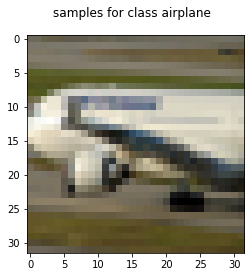

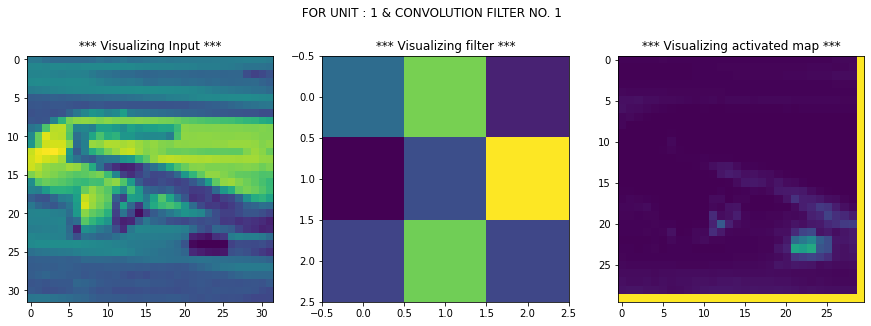

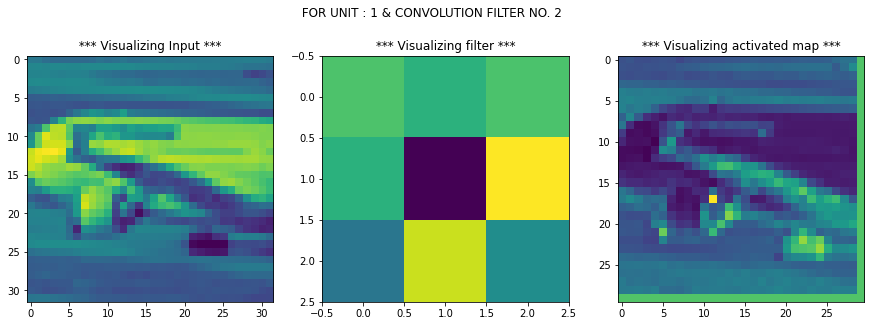

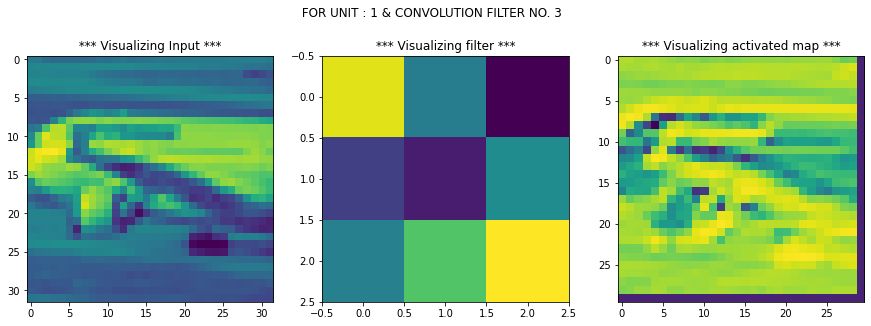

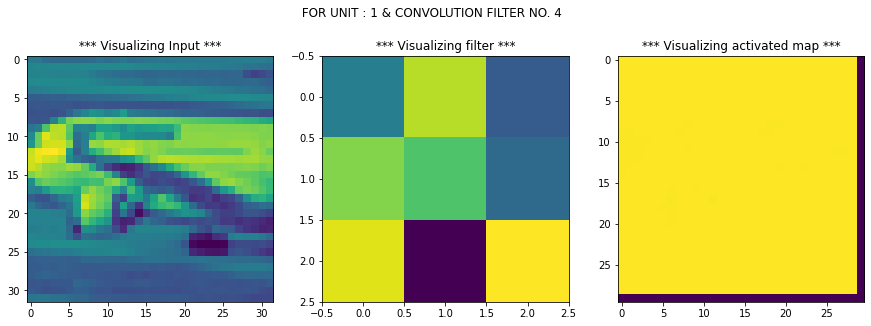

...

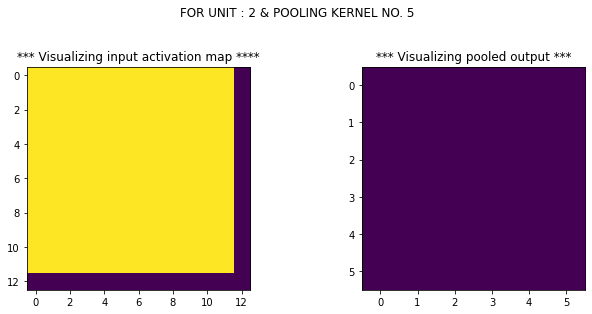

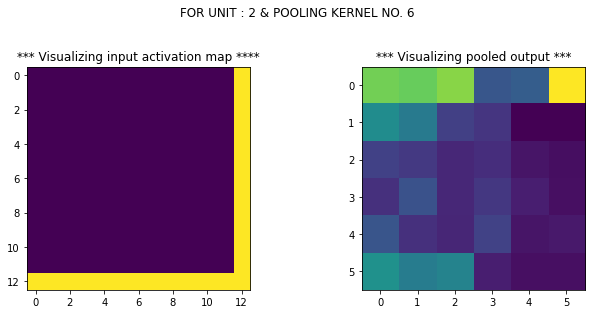

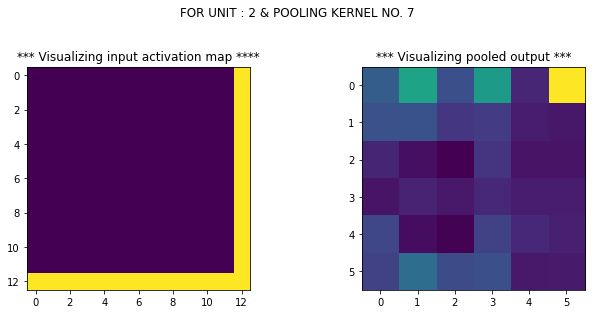

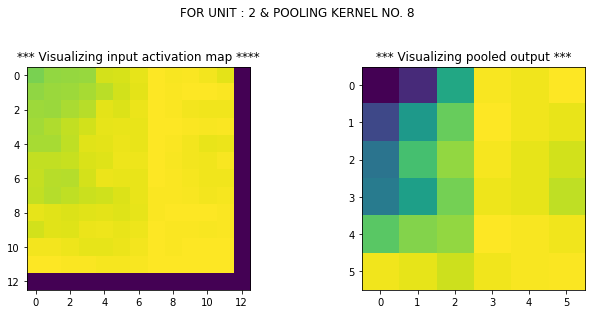

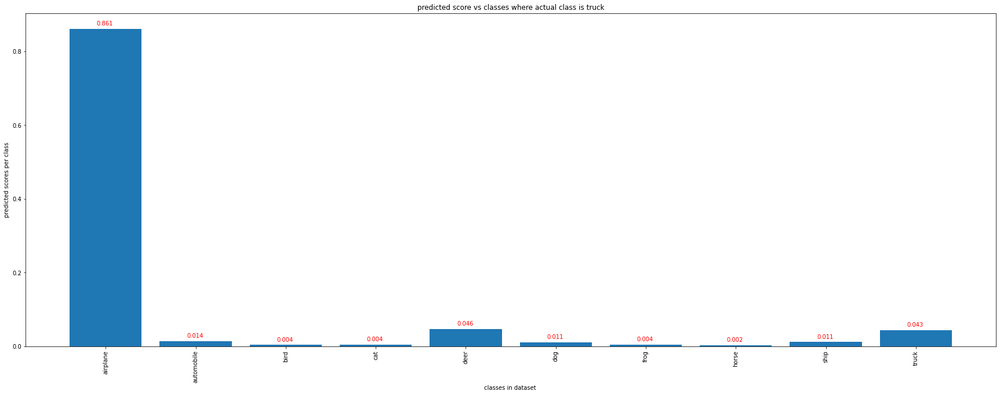

In [170]:
image_book={}
# for better visualization of predicted trends
#param_dict["conv_visualize_per_unit"]= [False,False]
#param_dict["pool_visualize_per_unit"]= [False,False]

for c in sample1.keys():
  print()
  print()
  print("********************* FOR USER INPUT IMAGE CLASS {} ****************".format(c))
  if c not in image_book.keys():
    image_book[c]={"image":[],"mlp_out":[], "bottleneck_out":[], "predicted":[]}
  # plotting the images present for this class in this sample
  fig,ax=plt.subplots(1,len(sample1[c]))
  fig.subplots_adjust(wspace=0.5,hspace=0.2)
  if len(sample1[c]) >1:
    for image,idx in zip(sample1[c],range(len(sample1[c]))):
      image_book[c]["image"].append(image)
      ax[idx].imshow(image.permute(1,2,0))
      ax[idx].set_title("Actual Image in 3 color channels")

  else:
    image_book[c]["image"].append(sample1[c][0])
    ax.imshow(sample1[c][0].permute(1,2,0))
  fig.suptitle(" samples for class {}".format(c))

  print()
  print()

  count=0
  for image in sample1[c]:
  
    # calling feed forward function which will take this image and param_dict as function
    # ------- NOTE: IMAGE SHOULD BE A NUMPY NDARRAY FOR FEED-FORWARD FUNCTION TO WORK CORRECTLY ----------
    print(" *********************** FOR IMAGE : {} **********************************".format(count+1))
    final_out,bottleneck_out,_,_,_,_=feed_forward_path(image.numpy(),param_dict,save_weights=True)
    image_book[c]["mlp_out"].append(final_out)
    image_book[c]["bottleneck_out"].append(bottleneck_out)
    top1,top2=predicted_class(final_out,data.classes.index(c),param_dict["non_linearity_output_layer"],data.classes)
    image_book[c]["predicted"]=(top1,top2)
    count+=1



  

# ***NOW PLOTTING HEAT MAP FOR COSINE DESIMILARITY. IT WILL HELP IN UNDERSTANDING TREND AND DISCRIMINABILITY***

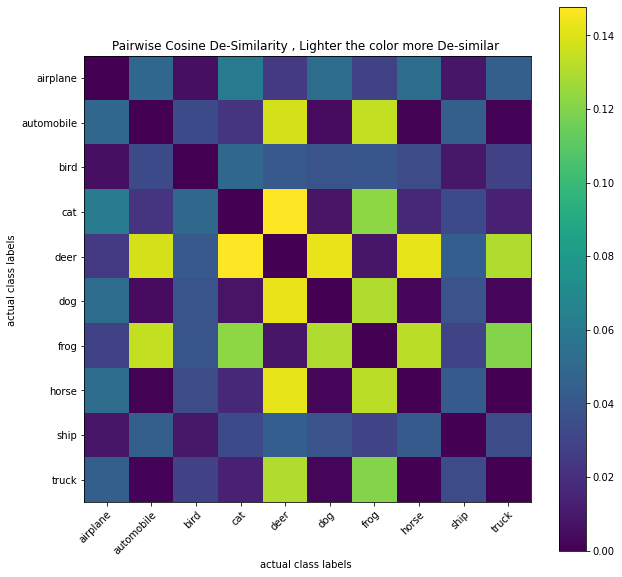

In [171]:
# plotting heat map for cosine desimilarity
predicted_score_vec=[]
actual_class=[]
for c in image_book.keys():
  t=[]
  for p in image_book[c]["mlp_out"]:
    t.append(p)
    actual_class.append(c)
  predicted_score_vec.append(t)
    
predicted_score_matrix=np.asarray(predicted_score_vec).reshape(len(image_book.keys()),-1)
#print(predicted_score_matrix)
plot_cosine_similarity_heatmap(predicted_score_matrix,actual_class)


# ***Output Vector Trend***

After understanding the bar plots and cosine de-similarity heat map it can be observed that thesew vectors are almost same across image classes . This hapeening because 

# **Q8) Does a randomly initialized network show any discriminability? Visualize (plot) the bottleneck layer (output of flattening layer) using PCA (builtin function) in 2D. Choose three images per class from CIFAR-10.**

Answer to above question is based on bar plots and heatmaps . As it can be observed that for maximum of the inputs , output vectors are , in case of softmax activation, peak at a certain class which is not same as actual class. 
Also the output vector of PMF is almost same for all inputs . Since weights of teh model once initialized remains same throught the data hence it can be said that any change across teh image class is not at all making any effect on the output.

This behavouir is expected since we are doing just one forward pass and not all doing any trainig/backprop. Thus no learning is happening . 



In [172]:
number_of_samples={"airplane":3,
 "automobile":3,
 "bird":3,
 "cat":3,
 "deer":3,
 "dog":3,
 "frog":3,
 "horse":3,
 "ship":3,
 "truck":3    
}

# ***BY RUNNING THIS CELL BELOW YOU CAN GET RANDOM SAMPLES(3 PER CLASS) ***

In [173]:
sample2=data_sampling(data,number_of_samples)



********************* FOR USER INPUT IMAGE CLASS airplane ****************


 *********************** FOR IMAGE : 1 **********************************
 For CNN Unit :1 Using saved weights from buffer itself
 **** VERIFYING THE OUTPUT DIMENSION AGAINST WHAT HAS BEEN TAUGHT IN LECTURES ****
 output dimension are ---> channels: 16 , height: 30, width:30 
formulae taught in class for output h and w are 
 outH = ((Hin-Hkernel+2*Hpad)/Hstride)+1 
 and 
 outW = ((Win-Wkernel+2*Wpad)/Wstride)+1
That is outH=((32-3+2*0)/1)+1 = 30.0 
That is outW=((32-3+2*0)/1)+1 = 30.0 
 For CNN Unit :2 Using saved weights from buffer itself
 **** VERIFYING THE OUTPUT DIMENSION AGAINST WHAT HAS BEEN TAUGHT IN LECTURES ****
 output dimension are ---> channels: 8 , height: 13, width:13 
formulae taught in class for output h and w are 
 outH = ((Hin-Hkernel+2*Hpad)/Hstride)+1 
 and 
 outW = ((Win-Wkernel+2*Wpad)/Wstride)+1
That is outH=((15-3+2*0)/1)+1 = 13.0 
That is outW=((15-3+2*0)/1)+1 = 13.0 
 Expected flat

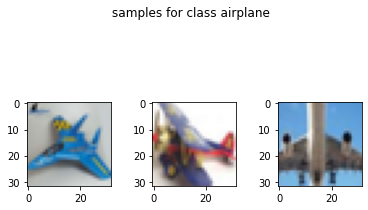

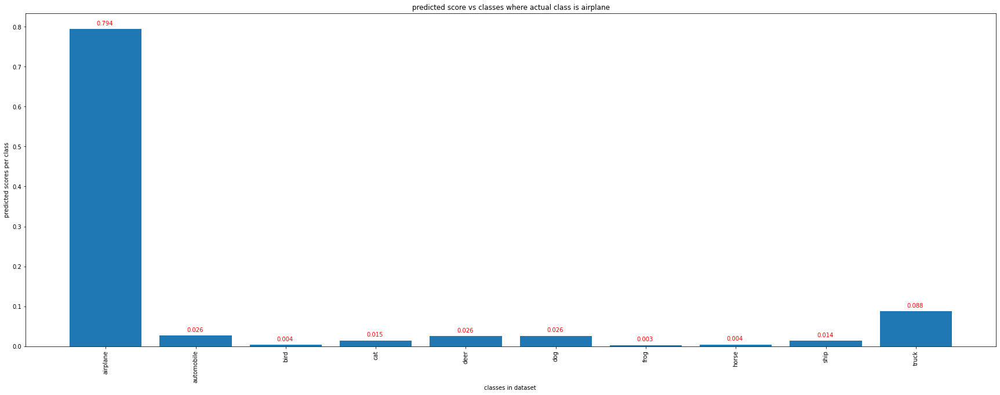

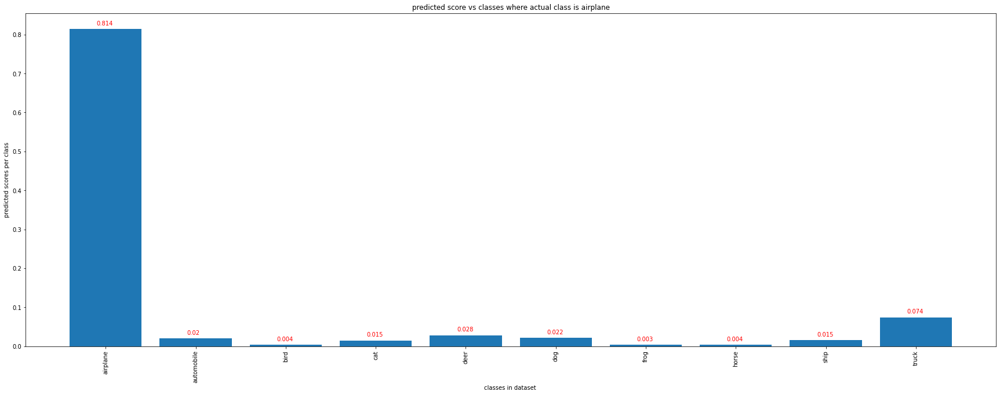

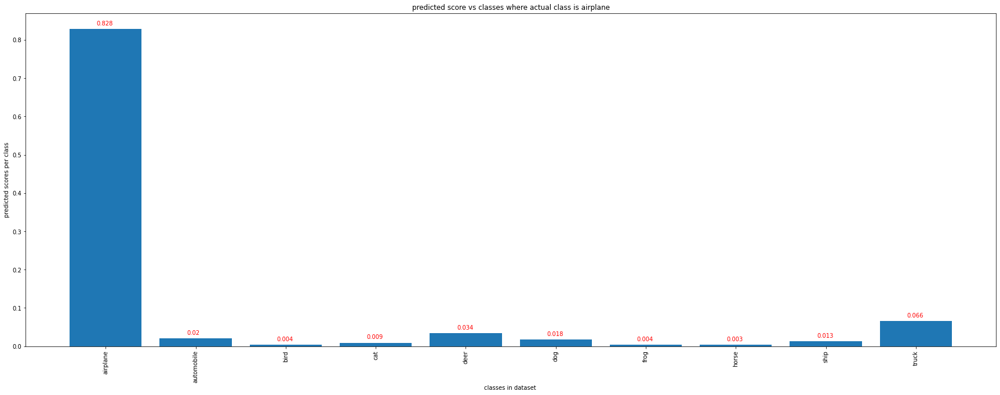

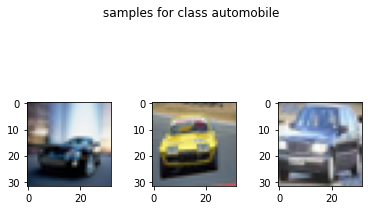

...

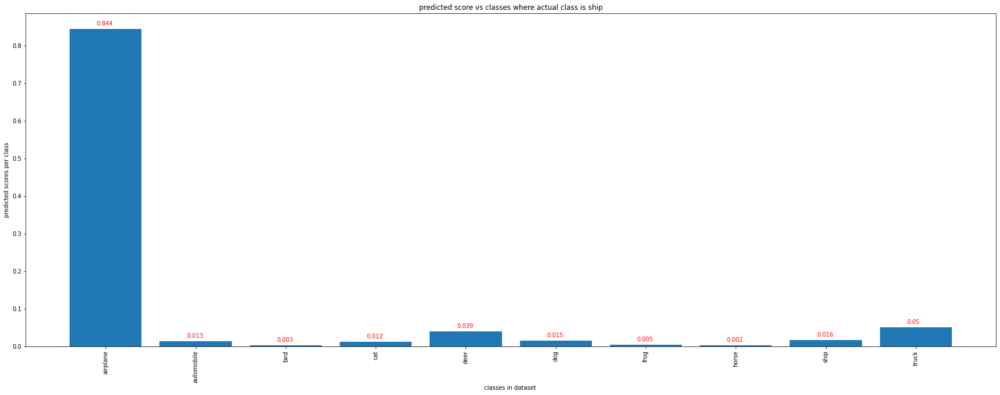

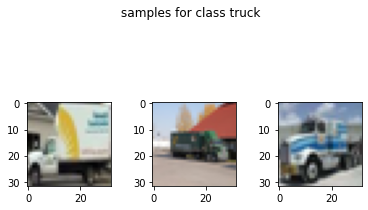

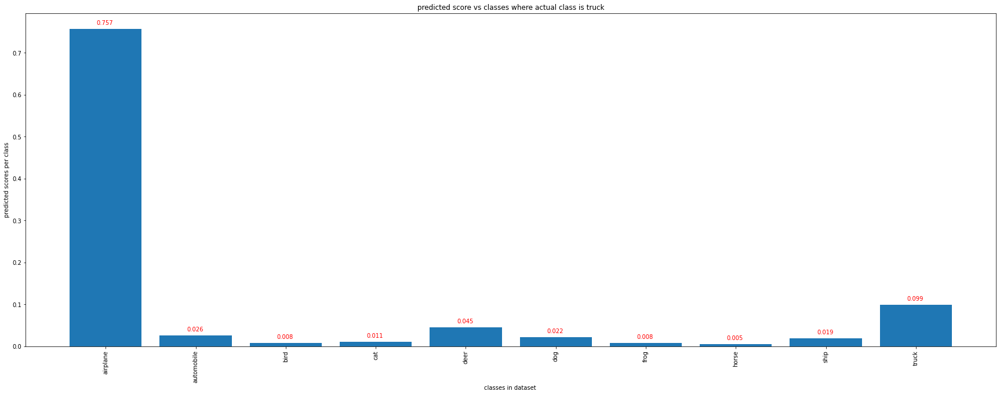

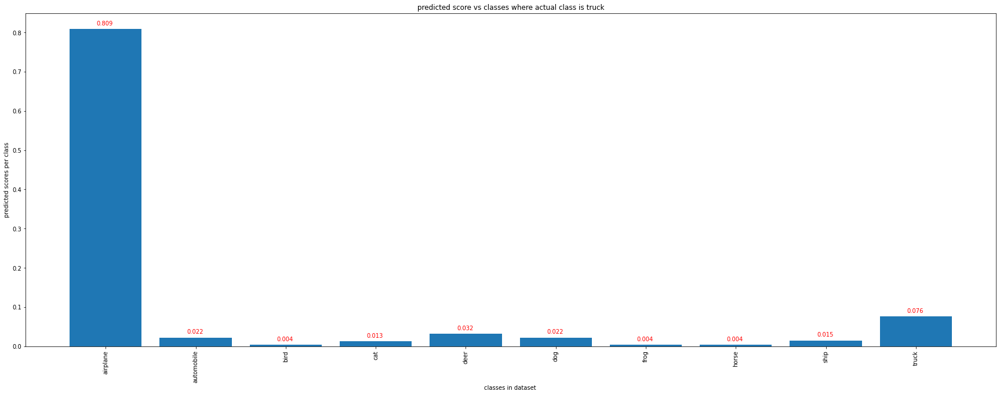

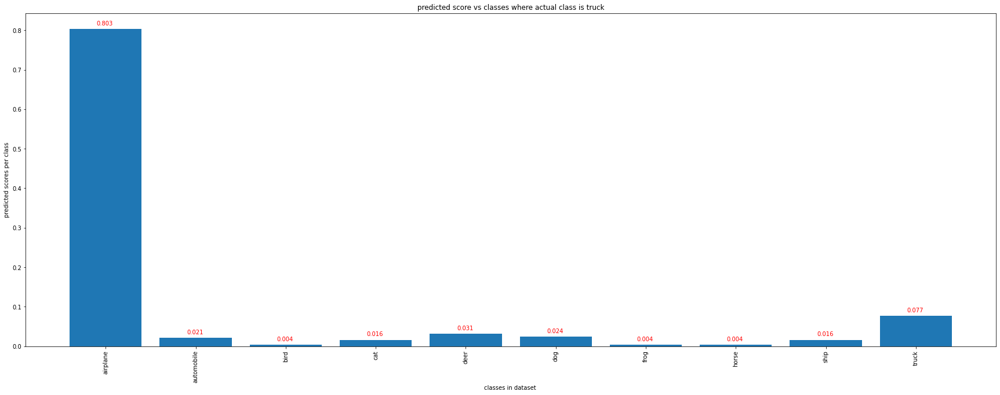

In [174]:
image_book={}
for c in sample2.keys():
  print()
  print()
  print("********************* FOR USER INPUT IMAGE CLASS {} ****************".format(c))
  if c not in image_book.keys():
    image_book[c]={"image":[],"mlp_out":[], "bottleneck_out":[], "predicted":[]}
  # plotting the images present for this class in this sample
  fig,ax=plt.subplots(1,len(sample2[c]))
  fig.subplots_adjust(wspace=0.5,hspace=0.2)
  if len(sample2[c]) >1:
    for image,idx in zip(sample2[c],range(len(sample2[c]))):
      image_book[c]["image"].append(image)
      ax[idx].imshow(image.permute(1,2,0))

  else:
    image_book[c]["image"].append(sample2[c][0])
    ax.imshow(sample2[c][0].permute(1,2,0))
  fig.suptitle(" samples for class {}".format(c))

  print()
  print()

  count=0
  for image in sample2[c]:
    print(" *********************** FOR IMAGE : {} **********************************".format(count+1))
    # calling feed forward function which will take this image and param_dict as function
    # ------- NOTE: IMAGE SHOULD BE A NUMPY NDARRAY FOR FEED-FORWARD FUNCTION TO WORK CORRECTLY ----------
    final_out,bottleneck_out,_,_,_,_=feed_forward_path(image.numpy(),param_dict,save_weights=True)
    image_book[c]["mlp_out"].append(final_out)
    image_book[c]["bottleneck_out"].append(bottleneck_out)
    top1,top2=predicted_class(final_out,data.classes.index(c),param_dict["non_linearity_output_layer"],data.classes)
    image_book[c]["predicted"]=(top1,top2)
    count+=1

**Visualizing bottleneck layer using PCA function**

In [175]:
from sklearn.decomposition import PCA

In [176]:
# plotting heat map for cosine desimilarity
bottleneck_vec=[]
actual_class=[]
for c in image_book.keys():  
  for p in image_book[c]["bottleneck_out"]:    
    actual_class.append(c)
    bottleneck_vec.append([p])
    
bottleneck_matrix=np.asarray(bottleneck_vec).reshape(len(image_book.keys())*3,-1)


In [177]:
bottleneck_matrix.shape

(30, 288)

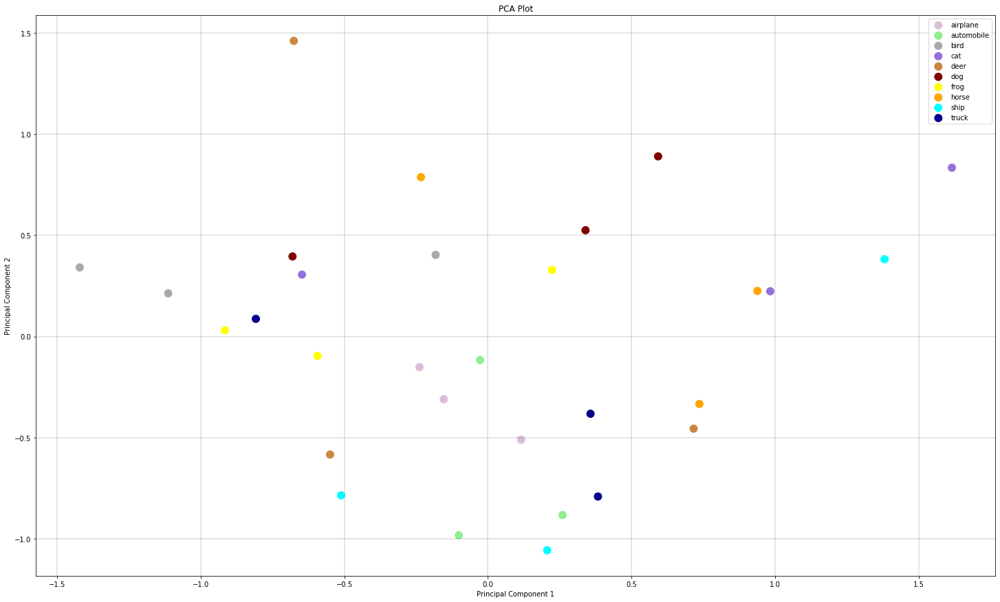

In [178]:
class_color={"airplane":"thistle",
 "automobile":"lightgreen",
 "bird":"darkgray",
 "cat":"mediumpurple",
 "deer":"peru",
 "dog":"maroon",
 "frog":"yellow",
 "horse":"orange",
 "ship":"cyan",
 "truck":"darkblue" 
}
color_list=[]
label_list=[]
for cls in class_color.keys():
  for _ in range(3):
    color_list.append(class_color[cls])
    label_list.append(cls)
pca = PCA(n_components=2)
pca.fit(bottleneck_matrix)
#class_color=['r','g','b','']
transformed = pca.transform(bottleneck_matrix)
fig,ax=plt.subplots(figsize=(25,15))
a=0
for cls in class_color.keys():
  ax.scatter(transformed[a:a+3, 0], transformed[a:a+3, 1],color=color_list[a:a+3],label=cls,s=120.0)
  a=a+3
ax.set_xlabel("Principal Component 1")
ax.set_ylabel("Principal Component 2")
ax.set_title("PCA Plot")
ax.legend()
ax.grid("minor",linewidth=0.2,color='black')


# **HENCE IT CAN BE ASSERTED THAT THERE SEEMS TO BE MINIMAL/NO DISCRIMINABILITY FOR A RANDOMLY INTIALIZED NETWORK SINCE DATA POINTS BELONGING TO SAME CLASS ARE FAR ENOUGH ON PCA PLOT AND POINTS BELONGING TO DIFFERENT CLASSES ARE NEAR ENOUGH ALTHOUGH ON DIFFERENT INPUTS OUTPUT CHANGES LITTLE BUT THIS CHANGE CAN NOT BE EXPALINED SINCE THERE IS NO LEARNING .**